## Plot json box on image 

In [161]:
import datetime
import json
import os

data_path = './DATA/'
json_file = 'custom_multy_coco.json'
#new_json_path = './out/'
new_json_path = './'
file_format = '.json'
new_json_file = 'custom_multy_coco'

class JsonAnt:
    

    
        # LOAD DATA
    def __init__(self):
        
        self.createDict()

    def createDict(self):
        print('Creating dict')
        jsonAnt = {"info": [        {
            "contributor": "Konkuk_university",
            "date_created": "2021/05/21",
            "description": "PGON JSON file",
            "url": "",
            "version": "1.0",
            "year": 2021
        }],
           "images": [],
           "annotations": [],
           "categories": [
            {
                "id": 1,
                "name": "Building, Overpass, Bridge"
            },
            {
                "id": 2,
                "name": "Road Marking, Lane Marking"
            },
            {
                "id": 3,
                "name": "Guard Rail, Fence, Soundproof Wall"
            }]
          }
        return jsonAnt
        

    
    def write_json(self, jsonAnt, loaded_json, num_found_files):
        
        source_infos = loaded_json['info']
        source_images = loaded_json['images']
        source_categories = loaded_json['categories']
        source_annotations = loaded_json['annotations']
        for _ in source_annotations:
            seg_list_b = _['segmentation'][0]
#             print(seg)
            xcoords, ycoords = [], []
            for i in range(0, len(seg_list_b), 2):
                xcoords.append(seg_list_b[i])
            for i in range(1, len(seg_list_b), 2):
                ycoords.append(seg_list_b[i])
            xmax, ymin = float(max(xcoords)), float(min(ycoords))
            ymax, xmin = float(max(ycoords)), float(min(xcoords))
            poly_bbox = [xmax, ymin, ymax, xmin]
            width, height = xmax - xmin, ymax - ymin
            bboxx = [xmin, ymin, width, height]
            seg_list_b = _['bbox']
        for _ in source_annotations:
            _['bbox'] = bboxx


#             print(bboxx)

        
#         print('\n FILE < ' + str(num_found_files) + ' > details: ')
        source_infos_l = []
        source_infos_l.append(source_infos)
        print('info: ' + str(len(source_infos_l)))
        source_images_l = []
        source_images_l.append(source_images)
        print('images: ' + str(len(source_images_l)))
        print('annotations: ' + str(len(source_annotations)))
        print('categories: ' + str(len(source_categories)))

        file_desc = source_infos['description']
        print(f'file type is :{file_desc[33:47]}')
        
        
        new_source_infos = jsonAnt['info']
        new_source_images = jsonAnt['images']
        new_source_categories = jsonAnt['categories']
        new_source_annotations = jsonAnt['annotations']


        
        
#         new_source_infos.append(source_infos)
#         jsonAnt['info'] = new_source_infos
        new_source_images.append(source_images)
        jsonAnt['images'] = new_source_images
#         new_source_categories.append(source_categories)
#         jsonAnt['categories'] = new_source_categories
        for i in source_annotations:
            new_source_annotations.append(i)
        jsonAnt['annotations'] = new_source_annotations
        print('\n After merging the new file')
        print('new_info: ' + str(len(new_source_infos)))        
        print('new_images: ' + str(len(new_source_images)))
        print('new_annotations: ' + str(len(new_source_annotations)))
        print('new_categories: ' + str(len(new_source_categories)))
#         print('NEW jsonAnt: ' + str(jsonAnt))
        return jsonAnt

        
        
        
# RUN THE PROGRAM
def main():
    
    callClass = JsonAnt()
    
    json_Ant  = callClass.createDict()

    
    
    num_found_files = []
    print(' Loading Coco json')
    for file in os.listdir(data_path):
        
        try:
            if 'json' in file:
                num_found_files =+ 1
                json_path = os.path.join(data_path, file)
                with open(json_path) as f:
                    loaded_json = json.load(f)
#                     print(f'loaded json11 {loaded_json}')
                print('\n  Loaded!')
#                 box_v  = callClass.poly_to_bbox(loaded_json)
                callClass.write_json(json_Ant, loaded_json, num_found_files)
#                 print('\n FILE < ' + str(num_found_files) + ' > details: ')
        except:
            if 'json' not in file:
                print(' Finished, nothing to load')
                return



    

    now = datetime.datetime.now()        # creating new file name with date attached
    currentDate = "_" + str(now.day) + "_" + str(now.hour) + "_" + str(now.minute) + "_" + str(now.second)
    file_output = os.path.join(new_json_file + currentDate + file_format)
    with open(new_json_path + file_output, 'a+') as outfile:
        json.dump(json_Ant, outfile, sort_keys=True, indent=4, )  # , indent=4, im.__dict__
        outfile.write('\n')
        outfile.close()
    print(f'    Location:  {new_json_path}  \n Output file:  {file_output} \n')
    
    
if __name__ == '__main__':
    main()

Creating dict
Creating dict
 Loading Coco json

  Loaded!
info: 1
images: 1
annotations: 150
categories: 3
file type is :PGON JSON file

 After merging the new file
new_info: 1
new_images: 1
new_annotations: 150
new_categories: 3

  Loaded!
info: 1
images: 1
annotations: 45
categories: 3
file type is :PGON JSON file

 After merging the new file
new_info: 1
new_images: 2
new_annotations: 195
new_categories: 3
    Location:  ./  
 Output file:  custom_multy_coco_25_20_34_38.json 



#  bbox  poly (from seg values)

Original Dimensions :  (1080, 1920, 3)
print file name in json: 201229_E_11_CCW_in_E_C_003_00039.png 
print file name: road_img.png 


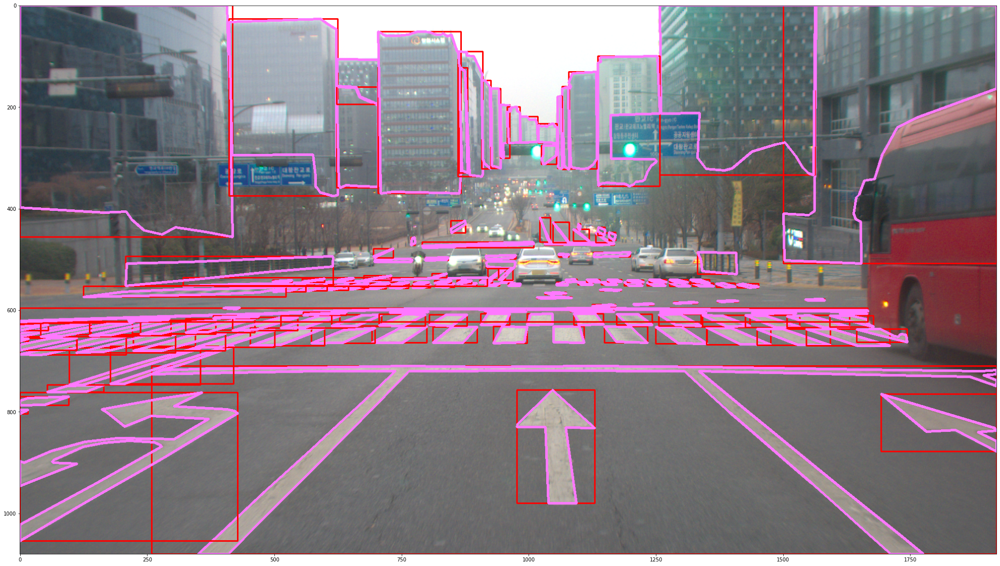

In [8]:
import json
import numpy as np
import cv2
from matplotlib import pyplot as plt

IMG = 'DATA/201229_E_11_CCW_in_E_C_003_00039.png'
IMG2 = 'DATA/201213_E_14_CCW_in_E_B_000_02578.png'

JSON = 'DATA/201229_E_11_CCW_in_E_C_003_00039_PGON.json'
JSON2 = 'DATA/201213_E_14_CCW_in_E_B_000_02578_PGON.json'


img = cv2.imread(IMG) # read image
img = cv2.cvtColor(img, cv2.COLOR_RGB2BGR) # convert rgb to bgr
print('Original Dimensions : ', img.shape)
coco_json_file = JSON  # read json annotation file 


def sort_poly_value(seg_list_p):  # function - get the segmentation values from cocojson file and plot it on image
    x_seg_coords, y_seg_coords = [], []  # store x and v values of seg list in different lists
    for i in range(0, len(seg_list_p), 2):  # iterate seg list values and choose first value and skip second
        x_seg_coords.append(seg_list_p[i])  # append the extracted odd values to the list
    for i in range(1, len(seg_list_p), 2):  # iterate seg list values and choose second value and skip third
        y_seg_coords.append(seg_list_p[i])  # append the extracted even values to the list
    zipped = zip(x_seg_coords, y_seg_coords) # zip the two files together 
    poly_list_for_cv2 = [list(ele) for ele in zipped] # iterate zipped list  and make a list for cv2 poligon
    return poly_list_for_cv2  # return list


def poly_to_bbox(seg_list_b):
    xcoords, ycoords = [], []
    for i in range(0, len(seg_list_b), 2):
        xcoords.append(seg_list_b[i])
    for i in range(1, len(seg_list_b), 2):
        ycoords.append(seg_list_b[i])
    xmax, ymin = int(max(xcoords)), int(min(ycoords))
    ymax, xmin = int(max(ycoords)), int(min(xcoords))
    poly_bbox = [xmax, ymin, ymax, xmin]
    width, height = xmax - xmin, ymax - ymin
    return [xmin, ymin, width, height]


with open(coco_json_file) as f:
    data = json.load(f)
print(f'print file name in json: {data["images"]["file_name"]} ')
data["images"]["file_name"] = 'road_img.png'  # my image - only for tests
print(f'print file name: {data["images"]["file_name"]} ')

for item in data["annotations"]:
    area = item["area"]
    seg_list = item["segmentation"]
    
    bbox = poly_to_bbox(seg_list[0])
    xmin, ymin, w, h = bbox
    img_mod = cv2.rectangle(img, (xmin, ymin), ((xmin + w), (ymin + h)), (255, 0, 0), 2)
    
    poli_ll = sort_poly_value(seg_list[0])
    res = np.array(poli_ll, np.int32)
    img_mod = cv2.polylines(img, [res], True, (255, 120, 255), 3)
plt.figure(figsize=(200, 20))
imgplot = plt.imshow(img_mod)
plt.show()
        

# only poly seg

Original Dimensions :  (1080, 1920, 3)
print file name before 201213_E_14_CCW_in_E_B_002_02589.png 
print file name road_img.png 


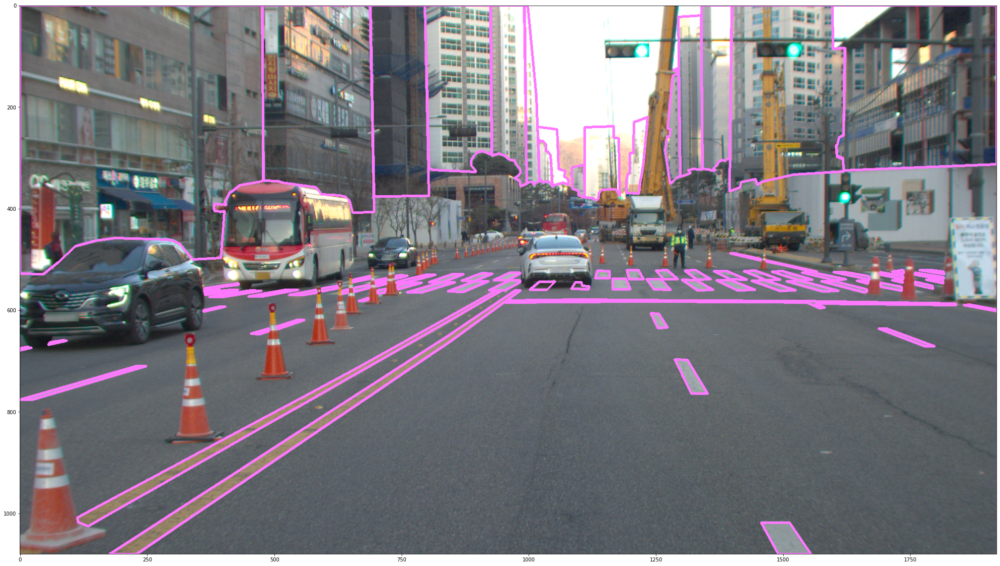

In [1]:
import json
# from PIL import Image, ImageDraw
# from PIL._imaging import display
import numpy as np
import cv2
from matplotlib import pyplot as plt

coco_json_file = 'road_ant_pgon.json'

with open(coco_json_file) as f:
    data = json.load(f)
    # print(data)
# data["images"]["file_name"] = 'road_img.png'  # my image - only for tests
# img = cv2.imread(data["images"]["file_name"])
img = cv2.imread('road_img.png')
img = cv2.cvtColor(img, cv2.COLOR_RGB2BGR)
print('Original Dimensions : ', img.shape)

print(f'print file name before {data["images"]["file_name"]} ')

data["images"]["file_name"] = 'road_img.png'  # my image - only for tests
print(f'print file name {data["images"]["file_name"]} ')


def read_poly(poly):
    x_values = []
    y_values = []
    res = []
    for i in (aa):
        x_values_s = []
        y_values_s = []

        for x, y in enumerate(i):
            #             print(f' count: {x} value: {y} ')
            if x % 2 == 1:
                y_values_s.append(y)
            #                 print(f' y_values {y} ')
            else:
                x_values_s.append(y)
        #                 print(f' x_values { y } ')
        #                 print(f' count { x } ')
        #                 print(f' count { x/2 } ')

        #         print(f' x values -s {x_values_s} ')
        #         print(f' y values -s {y_values_s} ')

        zipped = zip(list(x_values_s), list(y_values_s))
        z_v = list(zipped)
        #         print(' zv list')
        #         print( z_v)
        reslist = []
        for ele in z_v:
            #             print(ele)
            list(ele)

            reslist.append(list(ele))
        res.append(reslist)
        return res

#
# def poly_to_bbox(aa):
#     xcoords, ycoords = [], []
#     for i in range(0, len(aa), 2):
#         xcoords.append(aa[i])
#     for i in range(1, len(aa), 2):
#         ycoords.append(aa[i])
#
#     xmax, ymin = int(max(xcoords)), int(min(ycoords))
#     #     print(f'print xmax {xmax} print ymin {ymin} ')
#
#     ymax, xmin = int(max(ycoords)), int(min(xcoords))
#     #     print(f'print xmax {xmax} print ymin {ymin} ')
#
#     poly_bbox = [xmax, ymin, ymax, xmin]
#     #     print(poly_bbox, "poly_bbox")
#     width, height = xmax - xmin, ymax - ymin
#
#     return [xmin, ymin, width, height]


for item in data["annotations"]:
    area = item["area"]
    aa = item["segmentation"]
    #     print(aa)
    # bbox = poly_to_bbox(aa[0])
    # xmin, ymin, w, h = bbox
    poli_ll = read_poly(aa)

    # img_mod = cv2.rectangle(img, (xmin, ymin), ((xmin + w), (ymin + h)), (255, 0, 0), 2)

    res = np.array(poli_ll, np.int32)
    img_mod = cv2.polylines(img, [res], True, (255, 120, 255), 3)
plt.figure(figsize=(200, 20))
imgplot = plt.imshow(img_mod)
plt.show()


# only bbox (exracted from poly)

Original Dimensions :  (1080, 1920, 3)
print file name before 201213_E_14_CCW_in_E_B_002_02589.png 
print file name road_img.png 


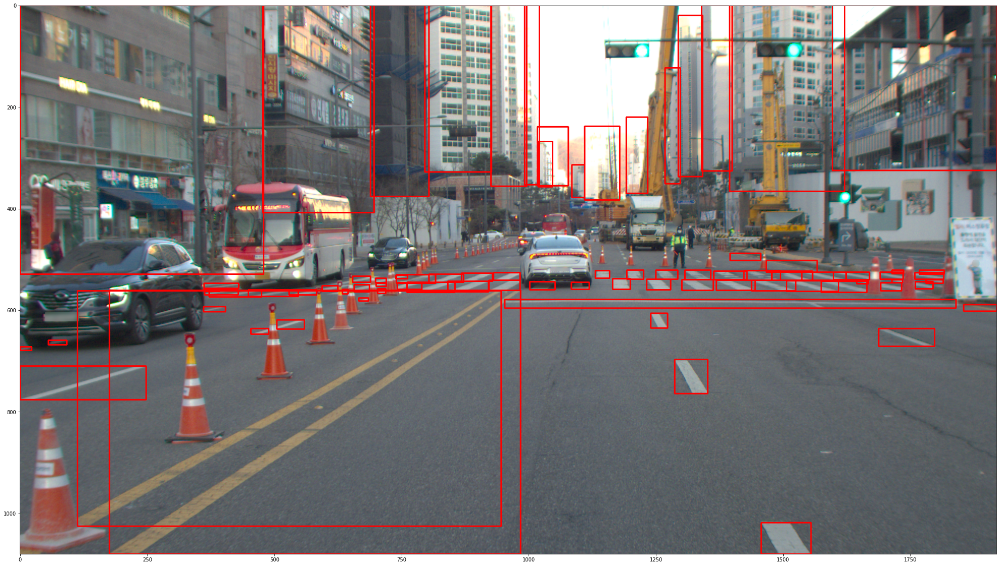

In [1]:
import json
import numpy as np
import cv2
from matplotlib import pyplot as plt

coco_json_file = 'road_ant_pgon.json'

with open(coco_json_file) as f:
    data = json.load(f)
img = cv2.imread('road_img.png')
img = cv2.cvtColor(img, cv2.COLOR_RGB2BGR)
print('Original Dimensions : ', img.shape)

print(f'print file name before {data["images"]["file_name"]} ')

data["images"]["file_name"] = 'road_img.png'  # my image - only for tests
print(f'print file name {data["images"]["file_name"]} ')

def poly_to_bbox(aa):
    xcoords, ycoords = [], []
    for i in range(0, len(aa), 2):
        xcoords.append(aa[i])
    for i in range(1, len(aa), 2):
        ycoords.append(aa[i])

    xmax, ymin = int(max(xcoords)), int(min(ycoords))
    ymax, xmin = int(max(ycoords)), int(min(xcoords))
    poly_bbox = [xmax, ymin, ymax, xmin]
    width, height = xmax - xmin, ymax - ymin

    return [xmin, ymin, width, height]


for item in data["annotations"]:
    area = item["area"]
    aa = item["segmentation"]
    bbox = poly_to_bbox(aa[0])
    xmin, ymin, w, h = bbox
    img_mod = cv2.rectangle(img, (xmin, ymin), ((xmin + w), (ymin + h)), (255, 0, 0), 2)

plt.figure(figsize=(200, 20))
imgplot = plt.imshow(img_mod)
plt.show()
